# Detection of Wheat Spike using CV and ML

###Controlling Growth Stages:
#####Monitoring Development: By detecting the number and area of wheat spikes, farmers can track the growth stages of their crops. This information helps in identifying the optimal times for applying fertilizers and other growth enhancers.

###Harvest Timing:
#####As the number and size of spikes increase closer to harvest, monitoring these metrics can help farmers determine the best time for harvesting to maximize yield and quality.

###Disease Detection:
#####A significant drop in the number or size of wheat spikes can indicate potential disease outbreaks or pest infestations. Early detection through computer vision can prompt timely intervention, reducing crop loss.

###Stress Indicators:
#####Variations in spike density and size can also signal abiotic stress factors such as drought, nutrient deficiencies, or extreme weather conditions, enabling farmers to take corrective actions.

###Density and Yield Correlation:
#####By analyzing the density of wheat spikes, breeders can estimate the potential yield of different wheat varieties. This information is crucial for selecting high-yielding strains.

###Breeding Programs:
######Data on spike characteristics can support breeding programs aimed at developing wheat varieties with desirable traits, such as higher yield, disease resistance, and climate adaptability.

In [5]:
import numpy as np
import pandas as pd
from glob import glob
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from bokeh.plotting import figure
from bokeh.io import output_notebook, show, output_file
import albumentations as albu

In [6]:

TRAIN_DIR = '/input/wheat-spike-detection/train/'
TEST_DIR = '/input/wheat-spike-detection/test/'
TRAIN_CSV_PATH = '/input/wheat-spike-detection/train.csv'

train_fns = glob(TRAIN_DIR + '*')
test_fns = glob(TEST_DIR + '*')

In [7]:
print('Number of train images is {}'.format(len(train_fns)))
print('Number of test images is {}'.format(len(test_fns)))

Number of train images is 3422
Number of test images is 10


In [8]:
train = pd.read_csv(TRAIN_CSV_PATH)

all_train_images = pd.DataFrame([fns.split('/')[-1][:-4] for fns in train_fns])
all_train_images.columns=['image_id']
all_train_images = all_train_images.merge(train, on='image_id', how='left')
all_train_images['bbox'] = all_train_images.bbox.fillna('[0,0,0,0]')

bbox_items = all_train_images.bbox.str.split(',', expand=True)
all_train_images['bbox_xmin'] = bbox_items[0].str.strip('[ ').astype(float)
all_train_images['bbox_ymin'] = bbox_items[1].str.strip(' ').astype(float)
all_train_images['bbox_width'] = bbox_items[2].str.strip(' ').astype(float)
all_train_images['bbox_height'] = bbox_items[3].str.strip(' ]').astype(float)

In [9]:
print('{} images without wheat heads.'.format(len(all_train_images) - len(train)))

49 images without wheat heads.


plotting image examples:

In [10]:
def get_all_bboxes(df, image_id):
    image_bboxes = df[df.image_id == image_id]

    bboxes = []
    for _,row in image_bboxes.iterrows():
        bboxes.append((row.bbox_xmin, row.bbox_ymin, row.bbox_width, row.bbox_height))

    return bboxes

def plot_image_examples(df, rows=3, cols=3, title='Image examples'):
    fig, axs = plt.subplots(rows, cols, figsize=(10,10))
    for row in range(rows):
        for col in range(cols):
            idx = np.random.randint(len(df), size=1)[0]
            img_id = df.iloc[idx].image_id

            img = Image.open(TRAIN_DIR + img_id + '.jpg')
            axs[row, col].imshow(img)

            bboxes = get_all_bboxes(df, img_id)

            for bbox in bboxes:
                rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
                axs[row, col].add_patch(rect)

            axs[row, col].axis('off')

    plt.suptitle(title)

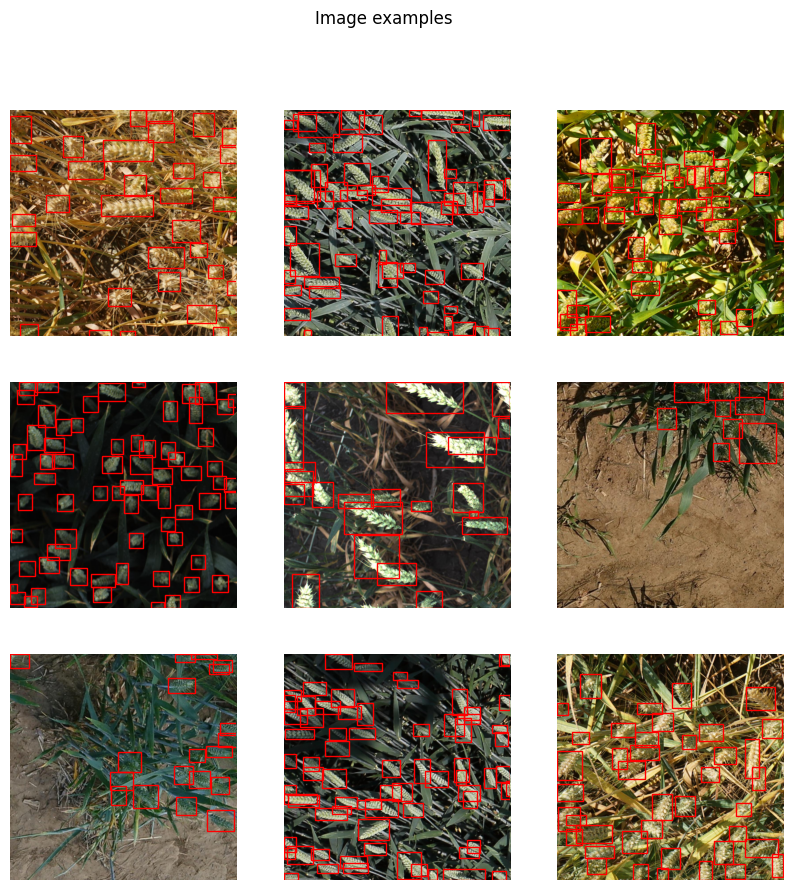

In [11]:
plot_image_examples(all_train_images)

Count number of bounding boxes per image:

In [12]:
all_train_images['count'] = all_train_images.apply(lambda row: 1 if np.isfinite(row.width) else 0, axis=1)
train_images_count = all_train_images.groupby('image_id').sum().reset_index()

In [13]:

def hist_hover(dataframe, column, colors=["#94c8d8", "#ea5e51"], bins=30, title=''):
    hist, edges = np.histogram(dataframe[column], bins = bins)

    hist_df = pd.DataFrame({column: hist,
                             "left": edges[:-1],
                             "right": edges[1:]})
    hist_df["interval"] = ["%d to %d" % (left, right) for left,
                           right in zip(hist_df["left"], hist_df["right"])]

    src = ColumnDataSource(hist_df)
    plot = figure(plot_height = 400, plot_width = 600,
          title = title,
          x_axis_label = column,
          y_axis_label = "Count")
    plot.quad(bottom = 0, top = column,left = "left",
        right = "right", source = src, fill_color = colors[0],
        line_color = "#35838d", fill_alpha = 0.7,
        hover_fill_alpha = 0.7, hover_fill_color = colors[1])

    hover = HoverTool(tooltips = [('Interval', '@interval'),
                              ('Count', str("@" + column))])
    plot.add_tools(hover)

    output_notebook()
    show(plot)

Most of the images have 20-50 wheat spikes on them.

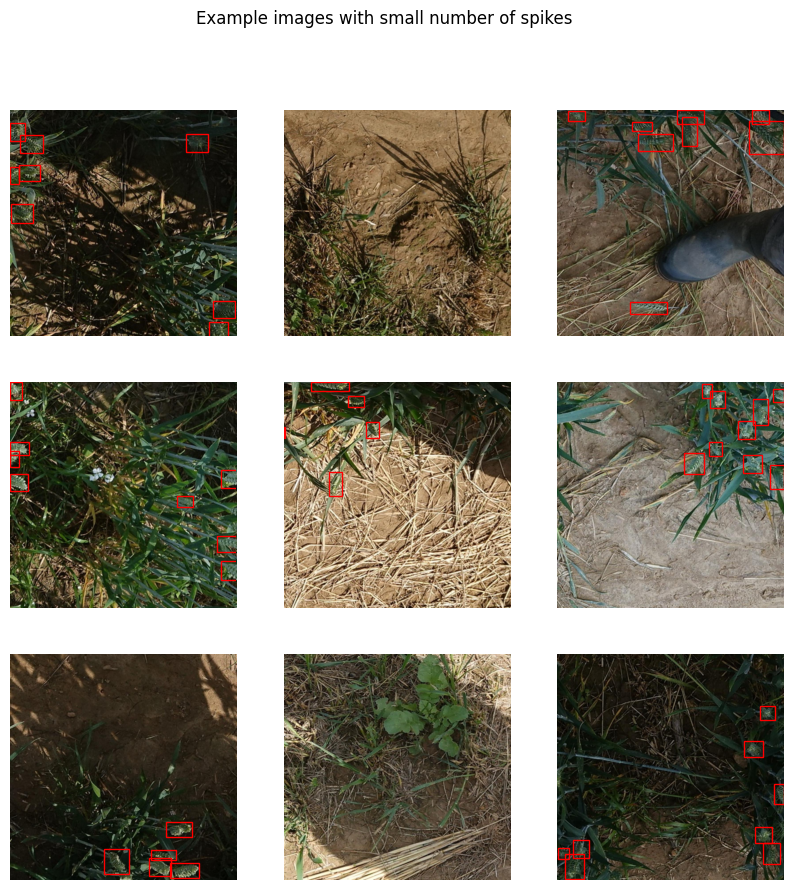

In [15]:
less_spikes_ids = train_images_count[train_images_count['count'] < 10].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(less_spikes_ids)], title='Example images with small number of spikes')

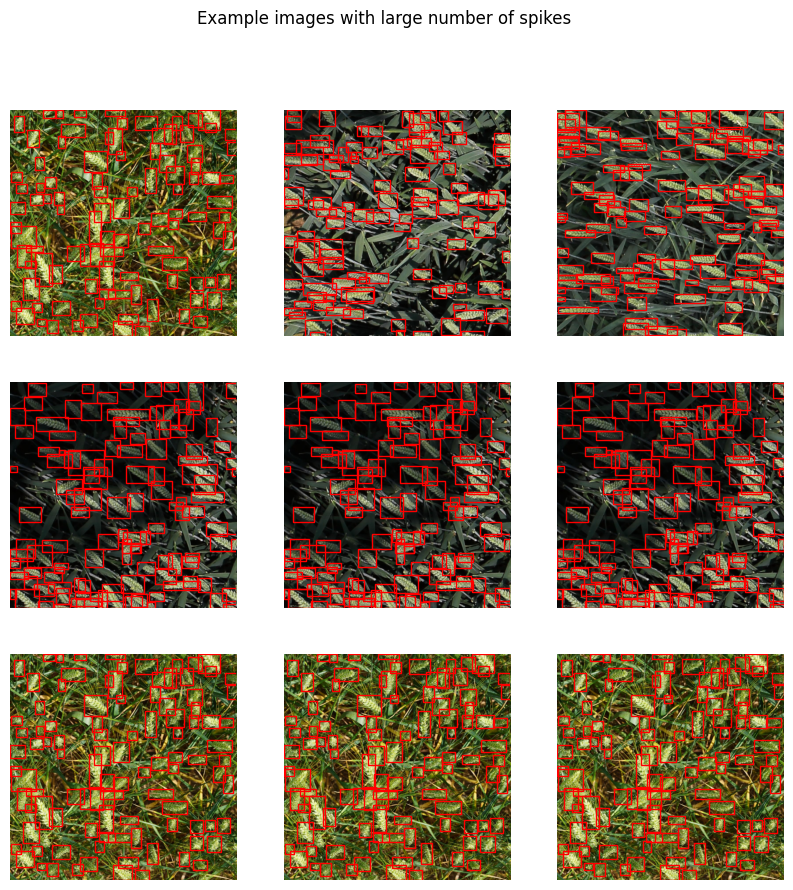

In [16]:
many_spikes_ids = train_images_count[train_images_count['count'] > 100].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(many_spikes_ids)], title='Example images with large number of spikes')

These actually look much better than those with small number of spikes.

In [17]:
all_train_images['bbox_area'] = all_train_images['bbox_width'] * all_train_images['bbox_height']

In [20]:
all_train_images.bbox_area.max()

529788.0

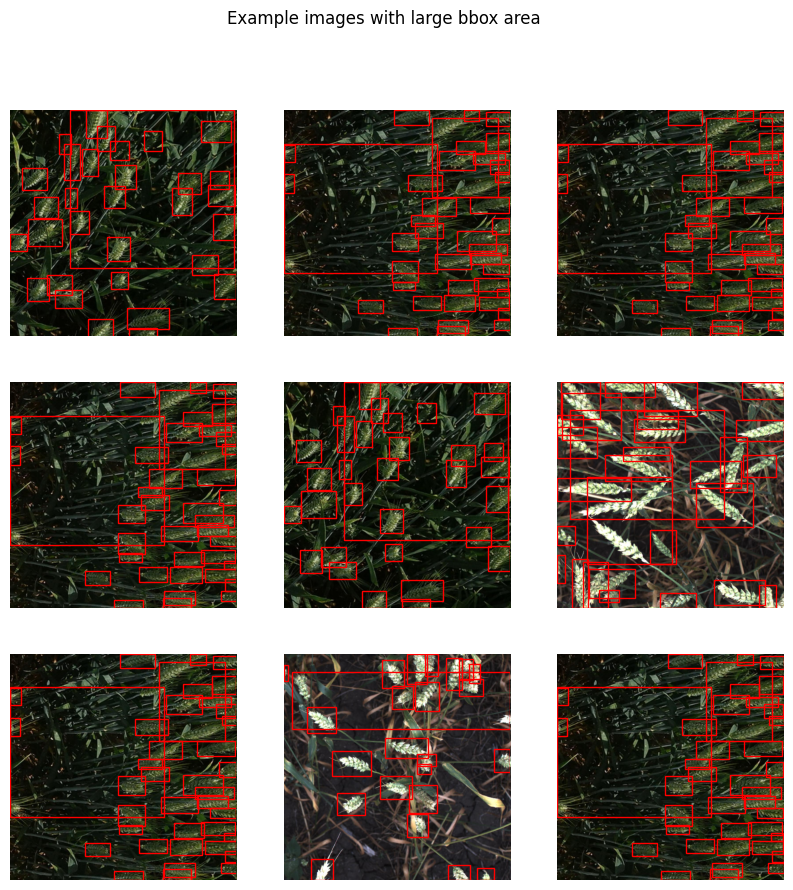

In [21]:
large_boxes_ids = all_train_images[all_train_images['bbox_area'] > 200000].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(large_boxes_ids)], title='Example images with large bbox area')

In [22]:
min_area = all_train_images[all_train_images['bbox_area'] > 0].bbox_area.min()
print('The smallest bounding box area is {}'.format(min_area))

The smallest bounding box area is 2.0


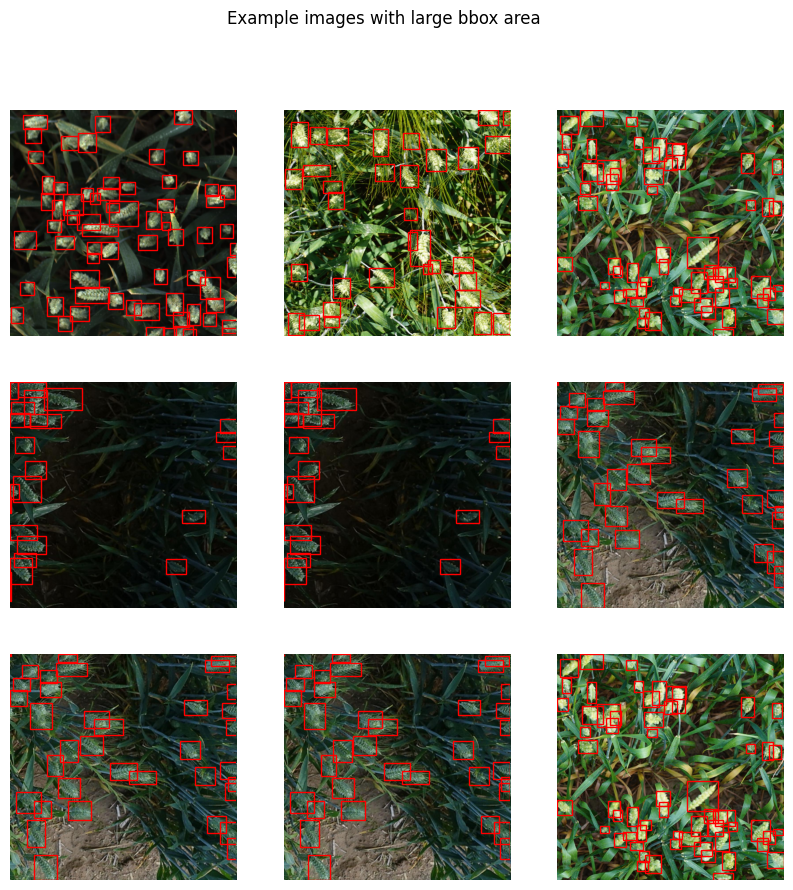

In [23]:
small_boxes_ids = all_train_images[(all_train_images['bbox_area'] < 50) & (all_train_images['bbox_area'] > 0)].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(small_boxes_ids)], title='Example images with large bbox area')

When working with object detection models for detecting wheat spikes, tiny bounding boxes near the image edges often result from how images are processed and divided into smaller patches. These small boxes typically arise if the bounding boxes are drawn before splitting the images, leading to fragments of the original boxes in the new smaller patches. These tiny bounding boxes have a negligible impact on the Intersection over Union (IoU) metric and overall model performance because they represent a minimal portion of the image and do not significantly alter the learning process.

Cleaning these small bounding boxes is not necessary since their impact is minimal. The model focuses on detecting and predicting the larger, more significant bounding boxes within the main areas of the images. To ensure robust model performance, it is more important to focus on accurately annotating the main objects and using data augmentation techniques to enhance the training dataset. This approach will help the model generalize better and ignore insignificant details like tiny bounding boxes.

In [24]:
area_per_image = all_train_images.groupby(by='image_id').sum().reset_index()
area_per_image_percentage = area_per_image.copy()
area_per_image_percentage['bbox_area'] = area_per_image_percentage['bbox_area'] / (1024*1024) * 100

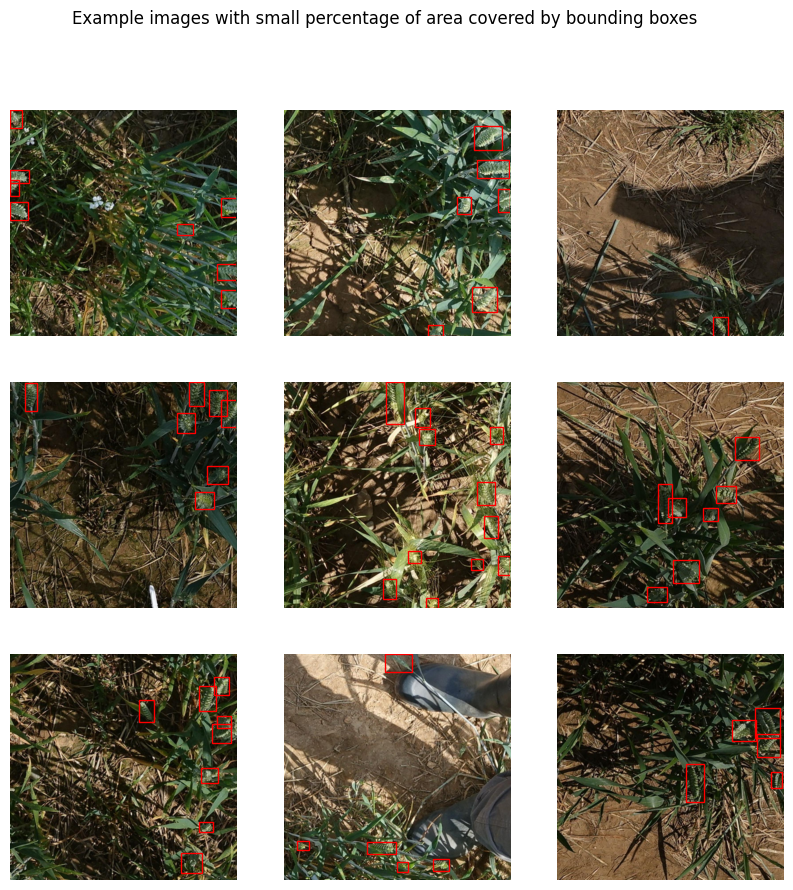

In [25]:
small_area_perc_ids = area_per_image_percentage[area_per_image_percentage['bbox_area'] < 7].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(small_area_perc_ids)], title='Example images with small percentage of area covered by bounding boxes')

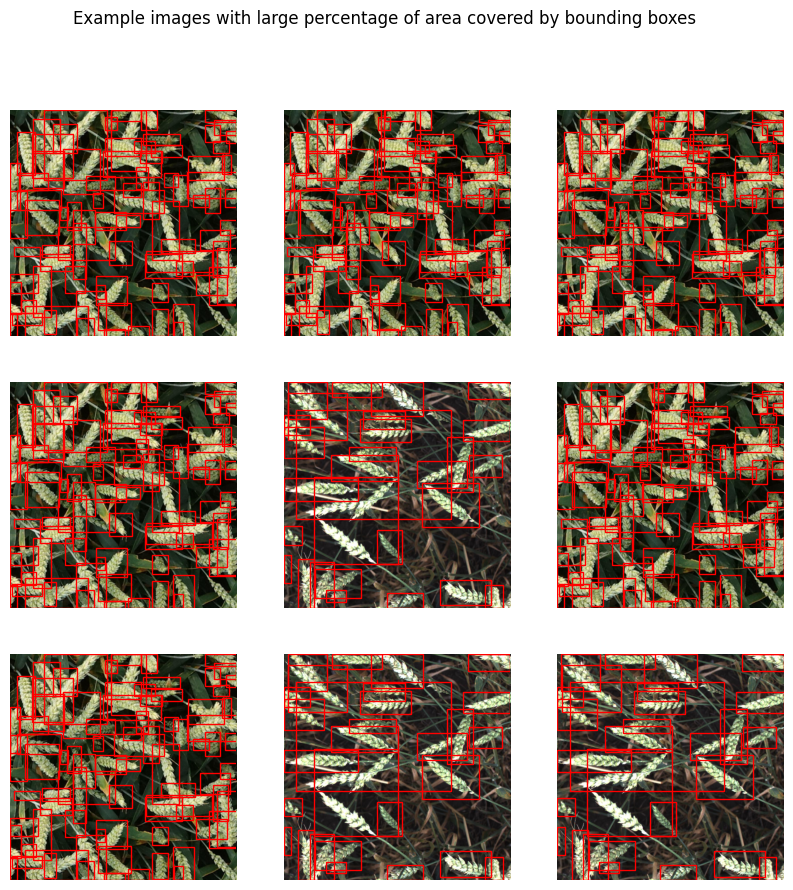

In [26]:
large_area_perc_ids = area_per_image_percentage[area_per_image_percentage['bbox_area'] > 95].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(large_area_perc_ids)], title='Example images with large percentage of area covered by bounding boxes')

In [27]:
def get_image_brightness(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return np.array(gray).mean()

def add_brightness(df):
    brightness = []
    for _, row in df.iterrows():
        img_id = row.image_id
        image = cv2.imread(TRAIN_DIR + img_id + '.jpg')
        brightness.append(get_image_brightness(image))

    brightness_df = pd.DataFrame(brightness)
    brightness_df.columns = ['brightness']
    df = pd.concat([df, brightness_df], ignore_index=True, axis=1)
    df.columns = ['image_id', 'brightness']

    return df

In [28]:
images_df = pd.DataFrame(all_train_images.image_id.unique())
images_df.columns = ['image_id']

In [29]:
images_df = pd.DataFrame(all_train_images.image_id.unique())
images_df.columns = ['image_id']
brightness_df = add_brightness(images_df)

all_train_images = all_train_images.merge(brightness_df, on='image_id')

Plot the darkest images:

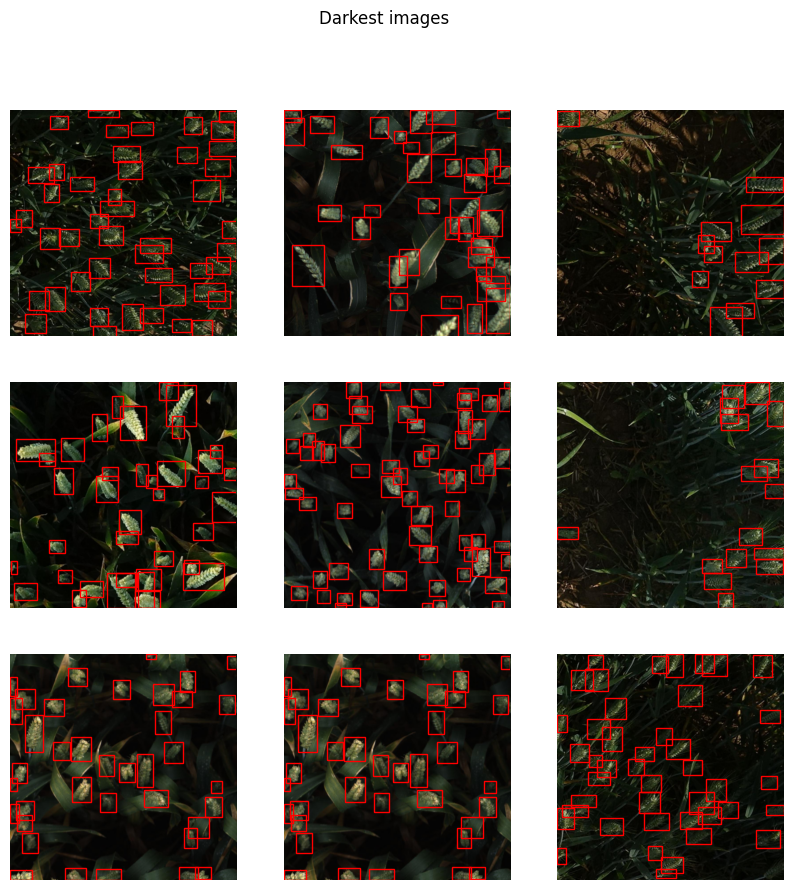

In [30]:
dark_ids = all_train_images[all_train_images['brightness'] < 30].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(dark_ids)], title='Darkest images')

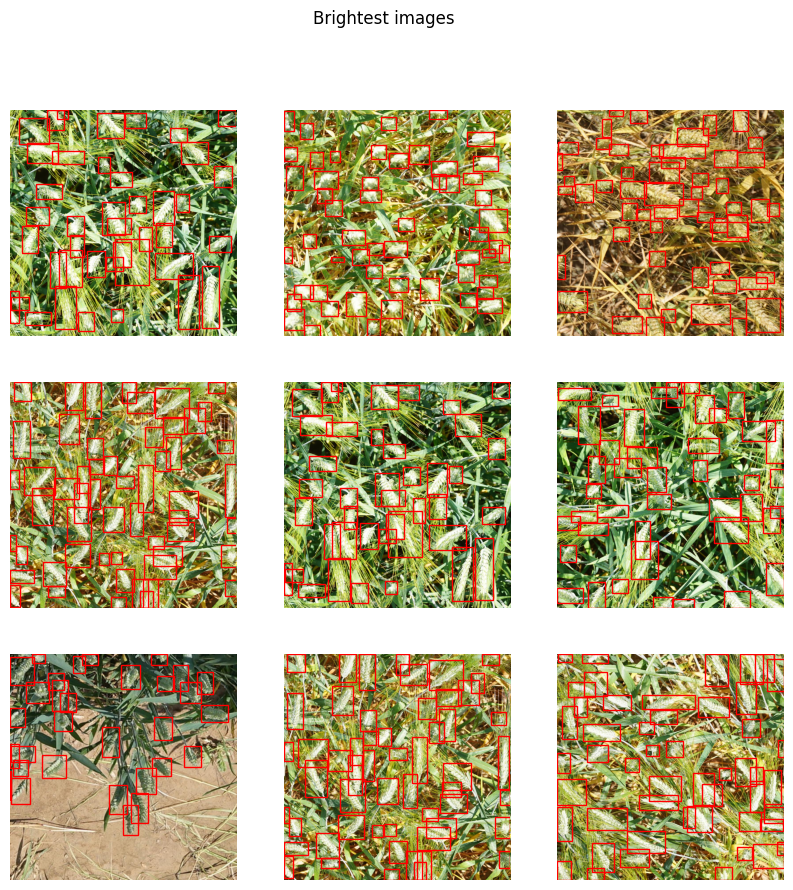

In [31]:
bright_ids = all_train_images[all_train_images['brightness'] > 130].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(bright_ids)], title='Brightest images')

In [32]:
def get_percentage_of_green_pixels(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    hsv_lower = (40, 40, 40)
    hsv_higher = (70, 255, 255)
    green_mask = cv2.inRange(hsv, hsv_lower, hsv_higher)

    return float(np.sum(green_mask)) / 255 / (1024 * 1024)

def get_percentage_of_yellow_pixels(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    hsv_lower = (25, 40, 40)
    hsv_higher = (35, 255, 255)
    yellow_mask = cv2.inRange(hsv, hsv_lower, hsv_higher)

    return float(np.sum(yellow_mask)) / 255 / (1024 * 1024)

def add_green_pixels_percentage(df):
    green = []
    for _, row in df.iterrows():
        img_id = row.image_id
        image = cv2.imread(TRAIN_DIR + img_id + '.jpg')
        green.append(get_percentage_of_green_pixels(image))

    green_df = pd.DataFrame(green)
    green_df.columns = ['green_pixels']
    df = pd.concat([df, green_df], ignore_index=True, axis=1)
    df.columns = ['image_id', 'green_pixels']

    return df

def add_yellow_pixels_percentage(df):
    yellow = []
    for _, row in df.iterrows():
        img_id = row.image_id
        image = cv2.imread(TRAIN_DIR + img_id + '.jpg')
        yellow.append(get_percentage_of_yellow_pixels(image))

    yellow_df = pd.DataFrame(yellow)
    yellow_df.columns = ['yellow_pixels']
    df = pd.concat([df, yellow_df], ignore_index=True, axis=1)
    df.columns = ['image_id', 'yellow_pixels']

    return df

In [42]:
green_pixels_df = add_green_pixels_percentage(images_df)
all_train_images = all_train_images.merge(green_pixels_df, on='image_id')

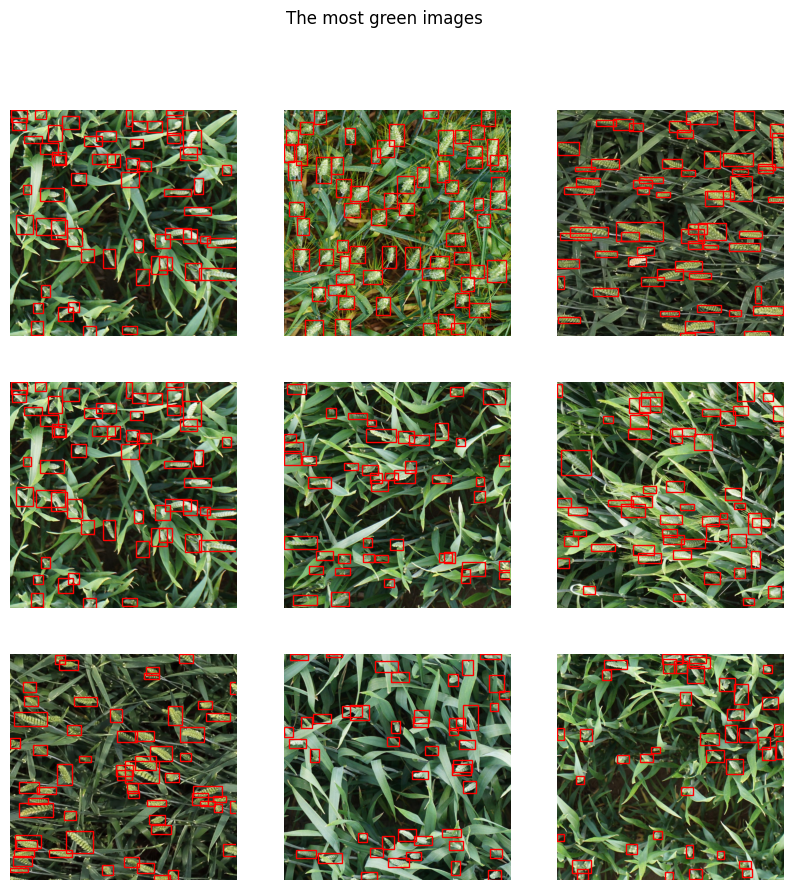

In [34]:
green_ids = all_train_images[all_train_images['green_pixels'] > 0.55].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(green_ids)], title='The most green images')

The most green images mostly contain the plants with very small spikes, which are just starting to appear.

In [35]:
yellow_pixels_df = add_yellow_pixels_percentage(images_df)
all_train_images = all_train_images.merge(yellow_pixels_df, on='image_id')

Let's look at the most yellow images:

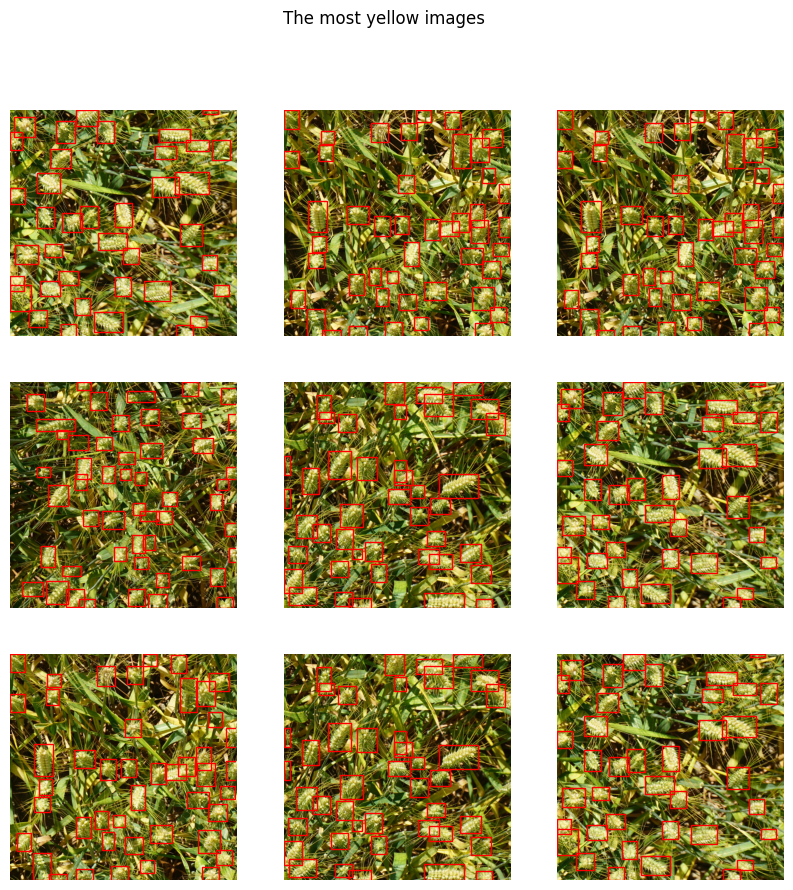

In [37]:
yellow_ids = all_train_images[all_train_images['yellow_pixels'] > 0.55].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(yellow_ids)], title='The most yellow images')

Example augmentation pipeline:

In [38]:
example_transforms = albu.Compose([
    albu.RandomSizedBBoxSafeCrop(512, 512, erosion_rate=0.0, interpolation=1, p=1.0),
    albu.HorizontalFlip(p=0.5),
    albu.VerticalFlip(p=0.5),
    albu.OneOf([albu.RandomContrast(),
                albu.RandomGamma(),
                albu.RandomBrightness()], p=1.0),
    albu.CLAHE(p=1.0)], p=1.0, bbox_params=albu.BboxParams(format='coco', label_fields=['category_id']))

/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1284: FutureWarning: RandomContrast has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1258: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


In [39]:
def apply_transforms(transforms, df, n_transforms=3):
    idx = np.random.randint(len(df), size=1)[0]

    image_id = df.iloc[idx].image_id
    bboxes = []
    for _, row in df[df.image_id == image_id].iterrows():
        bboxes.append([row.bbox_xmin, row.bbox_ymin, row.bbox_width, row.bbox_height])

    image = Image.open(TRAIN_DIR + image_id + '.jpg')

    fig, axs = plt.subplots(1, n_transforms+1, figsize=(15,7))

    axs[0].imshow(image)
    axs[0].set_title('original')
    for bbox in bboxes:
        rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
        axs[0].add_patch(rect)
    for i in range(n_transforms):
        params = {'image': np.asarray(image),
                  'bboxes': bboxes,
                  'category_id': [1 for j in range(len(bboxes))]}
        augmented_boxes = transforms(**params)
        bboxes_aug = augmented_boxes['bboxes']
        image_aug = augmented_boxes['image']

        axs[i+1].imshow(image_aug)
        axs[i+1].set_title('augmented_' + str(i+1))
        for bbox in bboxes_aug:
            rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
            axs[i+1].add_patch(rect)
    plt.show()

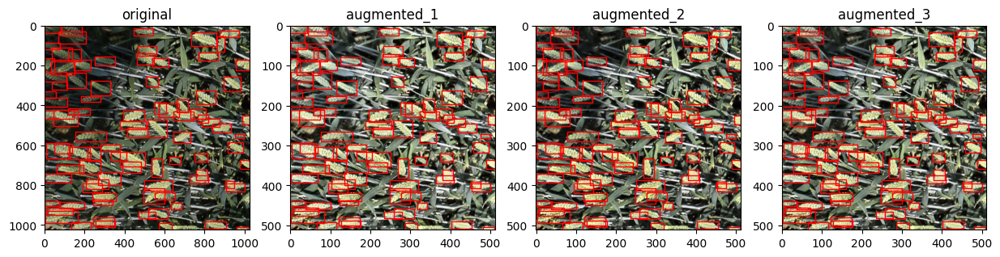

In [40]:
apply_transforms(example_transforms, all_train_images, n_transforms=3)

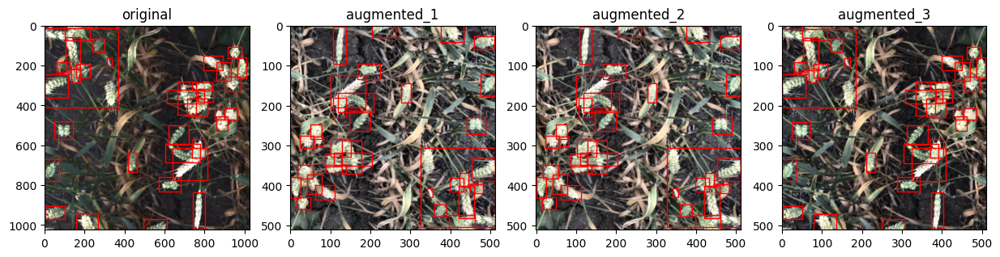

In [41]:
apply_transforms(example_transforms, all_train_images, n_transforms=3)

Note how CLAHE emphasizes the features in darker spots. It is a must have for this competition.

#Conclusions:
#### - Zoom Levels:The images were taken at different zoom levels, meaning that the size of the wheat spikes varies significantly between images. To handle this, crop and resize data augmentations should be applied during model training to ensure that the model can learn to detect wheat spikes at various scales.

#### - Lighting Conditions: The images were captured under various lighting conditions, which can affect the visibility and appearance of the wheat spikes. To address this, special filters should be used during preprocessing to normalize the lighting conditions and help the model learn to detect spikes regardless of the lighting.

#### - Bounding Box Issues: The bounding boxes in the dataset are not uniformly accurate:

#####1. Giant Bounding Boxes: Some bounding boxes are excessively large and may cover areas beyond the wheat spikes. These should be identified based on their area and removed before training to avoid confusing the model.
#####2. Micro Bounding Boxes: There are also very small bounding boxes near the edges of the images. These are likely artifacts from the image splitting process. They can remain in the dataset because they have a minimal impact on the IoU metric and overall model performance.
#####3. Missing Bounding Boxes: Some spikes are not surrounded by bounding boxes at all. This missing annotation issue should be acknowledged, though it might not be easily fixable without re-annotating the dataset. The model should be trained to be robust enough to detect spikes even when some are not annotated in the training data.